In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import os
from datetime import datetime

# Data loading

In [2]:
DATA_PATH = "data/fage-automne2021_merle-printemps2022/"
allFiles = os.listdir(DATA_PATH)    
csvFiles = list(filter(lambda f: f.endswith('.csv'), allFiles))
print(csvFiles)
data = [pd.read_csv(DATA_PATH+csvFile, sep=';', header=1) for csvFile in csvFiles]

['Supagro_28th-March-2022-17-4-7_COL21.csv', 'Supagro_28th-March-2022-17-39-50_COL18.csv', 'Supagro_28th-March-2022-15-57-49_COL14041.csv', 'Supagro_28th-March-2022-16-19-10_COL20.csv', 'Supagro_28th-March-2022-15-26-27_COL14274.csv', 'Supagro_28th-March-2022-16-52-45_COL4005.csv', 'Supagro_28th-March-2022-17-15-49_COL4279.csv', 'Supagro_28th-March-2022-16-30-59_COL17.csv', 'Supagro_28th-March-2022-15-37-35_COL19.csv', 'Supagro_25th-March-2022-13-40-58_COL14042.csv', 'Supagro_28th-March-2022-17-30-14_COL22.csv', 'Supagro_28th-March-2022-15-47-17_COL4109.csv', 'Supagro_28th-March-2022-18-5-29_COL13.csv', 'Supagro_28th-March-2022-18-16-12_COL4288.csv', 'Supagro_28th-March-2022-18-27-23_COL14134.csv', 'Supagro_28th-March-2022-17-52-54_COL25.csv', 'Supagro_28th-March-2022-15-2-36_COL23.csv', 'Supagro_28th-March-2022-15-14-27_COL14263.csv', 'Supagro_28th-March-2022-16-8-10_COL14244.csv']


# Clean data

In [3]:
def cleanData(df):
    cleanedDf = df.copy()
    cleanedDf.columns=['timestamp', 'lat', 'lon']
    cleanedDf = cleanedDf.apply(pd.to_numeric, errors='coerce')
    cleanedDf['date'] = pd.to_datetime(cleanedDf.timestamp, unit="s")
    cleanedDf.loc[cleanedDf.timestamp < cleanedDf.timestamp[0], 'timestamp'] = -1
    cleanedDf.loc[cleanedDf.timestamp > cleanedDf.timestamp[len(cleanedDf)-1], 'timestamp'] = -1
    # cleanedDf.timestamp = cleanedDf.timestamp.replace(-1, np.NaN)
    cleanedDf = cleanedDf.loc[cleanedDf.timestamp != -1].reset_index(drop=True)
    cleanedDf = cleanedDf.dropna().reset_index(drop=True)
    # cleanedDf = cleanedDf.interpolate()
    return cleanedDf

def cleanAllData(data):
    return [cleanData(df) for df in data]

def plotDateContinuity(df):
    px.line(df.timestamp).show()



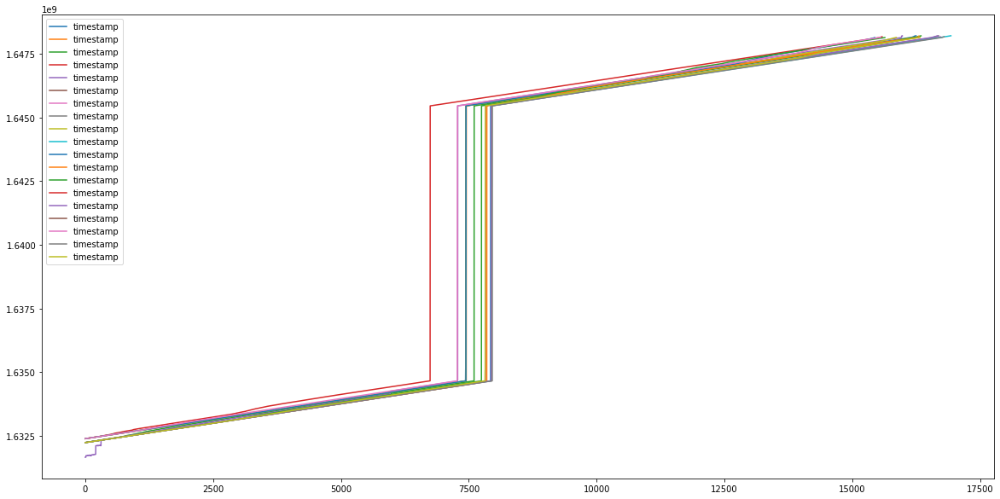

In [4]:
data = cleanAllData(data)
for df in data:
    df.timestamp.plot(figsize=(20, 10), legend=True)



In [18]:
df =data[17]
df.head()

,timestamp,lat,lon,date
0,1632232068,43.930710,3.100827,2021-09-21 13:47:48
1,1632232368,43.930725,3.100757,2021-09-21 13:52:48
2,1632232668,43.930800,3.100698,2021-09-21 13:57:48
3,1632232968,43.930836,3.100688,2021-09-21 14:02:48
4,1632233268,43.931328,3.100210,2021-09-21 14:07:48


# Distance and speed computing

In [19]:
STUDY_LATITUDE = 43
EARTH_CIRCUMFERENCE = 40075000

In [20]:
import geopy.distance

def longitudeDecimalDegreesToMeters(longitude, latitude=STUDY_LATITUDE, system_circumference=EARTH_CIRCUMFERENCE):
    return longitude * system_circumference * np.cos(latitude * np.pi/180) / 360

def latitudeDecimalDegreesToMeters(latitude, system_circumference=EARTH_CIRCUMFERENCE):
    return latitude * system_circumference / 360

def latLon_decimalDegreesToMeters_df(df, lat='lat', lon='lon', latitude=STUDY_LATITUDE, system_circumference=EARTH_CIRCUMFERENCE):
    if not lat in df.columns or not lon in df.columns:
        print('error there is not latitude nor longitude columns')
        return df
    return pd.DataFrame({
        'x': df[lon].map(lambda x: longitudeDecimalDegreesToMeters(x, latitude=latitude, system_circumference=system_circumference)),
        'y': df[lat].map(lambda x: latitudeDecimalDegreesToMeters(x, system_circumference=EARTH_CIRCUMFERENCE))
    })

def latLon_distanceFromSeries_df(df, lat='lat', lon='lat', system_circumference=EARTH_CIRCUMFERENCE):
    if not lat in df.columns or not lon in df.columns:
        print('error there is not latitude nor longitude columns')
        return df
    dfWithDist = df.copy()
    dist=[0]
    for i in range(1,len(df)):
        dist.append(geopy.distance.geodesic((df[lat].iloc[i],df[lon].iloc[i]),(df[lat].iloc[i-1],df[lon].iloc[i-1])).m)
    dfWithDist['dist']=dist
    return dfWithDist

def speedFormDateDistSeries_df(df, time='timestamp', dist='dist'):
    if not time in df.columns or not dist in df.columns:
        print('error there is not time nor distance columns')
        return df
    dfWithSpeed = df.copy()
    speed=[0]
    for i in range(1,len(df)):
        speed.append(df[dist].iloc[i]/(df[time].iloc[i]-df[time].iloc[i-1]))
    dfWithSpeed['speed']=  speed
    return dfWithSpeed

In [21]:
df = latLon_distanceFromSeries_df(df)
df = speedFormDateDistSeries_df(df)

In [22]:
px.line(df.timestamp).show()
px.line(df.lon).show()
px.line(df.lat).show()
px.line(df.dist).show()
px.line(df.speed).show()

# Plot area

In [23]:
import folium

samples=df[df.lat > 43.9] # parse data to one area
lonMin = min(samples.lon) - 0.001
lonMax = max(samples.lon) + 0.001
latMin = min(samples.lat) - 0.001
latMax = max(samples.lat) + 0.001

map_osm = folium.Map(location=[43.92, 3.10])

#for ind, lat, lon, com in df[['lat', 'long', 'Nom commune']][:50].itertuples():
#    map_osm.add_child(folium.RegularPolygonMarker(location=[lat,lon], popup=com,
#                       fill_color='#132b5e', radius=5))
for ind,timestamp,lat,lon,date, dist, speed in samples.itertuples():
    map_osm.add_child(
        folium.RegularPolygonMarker(
            location=[lat,lon],
            popup=(date, lat, lon),
            fill_color='#132b5e', radius=5
        )
    )

map_osm.fit_bounds([[latMin,lonMin], [latMax,lonMax]])
map_osm

# Get one day subset

In [24]:
def getDaysSubSamples(samples, startIsoDate, n=1):
    startTimestamp = int(datetime.timestamp(date.fromisoformat(startIsoDate)))
    startIndex=0
    while samples.timestamp[startIndex] < startTimestamp:
        startIndex+=1
    endIndex=startIndex
    while samples.timestamp[endIndex] < samples.timestamp[startIndex] + n*86400:
        if endIndex>= len(samples):
            break
        endIndex+=1
    return samples[startIndex:endIndex]
    
daySample = getDaysSubSamples(df, '2021-10-09')

# Speed threshold classification

## Load custom thresholds

In [56]:
THRESHOLDS = [0.01, 0.2, 3.0, 130.0]
CATEGORIES = ['resting', 'grazing', 'moving', 'transpoting']

## Classify data with custom thresholds

In [57]:
def categorizeSpeed_df(df, speed='speed'):
    if not speed in df.columns:
        print('error there is not speed columns')
        return df

    def speedMap(speed):
        thresholds = {category: THRESHOLDS[i] for i, category in enumerate(CATEGORIES)}
        for action, speedThreshold in thresholds.items():
            if speed < speedThreshold:
                return action
        return 'toFast'
        
    dfWithAction = df.copy()
    dfWithAction['action'] = dfWithAction.speed.map(lambda s: speedMap(s))
    return dfWithAction

daySample = categorizeSpeed_df(daySample)
daySample.head()

,timestamp,lat,lon,date,dist,speed,action
4917,1633730525,43.927273,3.102552,2021-10-08 22:02:05,46.063136,0.076772,grazing
4918,1633731124,43.927273,3.102565,2021-10-08 22:12:04,0.000000,0.000000,resting
4919,1633731424,43.927270,3.102560,2021-10-08 22:17:04,0.411278,0.001371,resting
4920,1633731724,43.927246,3.102540,2021-10-08 22:22:04,3.290221,0.010967,grazing
4921,1633732024,43.927246,3.102545,2021-10-08 22:27:04,0.000000,0.000000,resting


## dashboard

In [62]:
from dash import dcc, html, Input, Output
from jupyter_dash import JupyterDash
import plotly.graph_objects as go
import numpy as np

def dashboard(data):
    app = JupyterDash(__name__)

    app.layout = html.Div([
        html.H4('Interactive speed value and classification over time.'),
        dcc.Graph(id="graph"),
        html.P("Time frame:"),
        dcc.Slider(id="slider", min=5, max=25, value=5, step=5),
    ])

    @app.callback(
        Output("graph", "figure"), 
        Input("slider", "value")
    )
    def update_bar_chart(timeframe):
        data = daySample[::int(timeframe/5)]
        fig = px.bar(data.speed, color=data.action)
        return fig

    app.run_server(mode='inline', debug=True)
dashboard(daySample.copy())

# Speed classification K-means

## K-means algo

In [63]:
from sklearn.cluster import KMeans

def k_means(training):
  '''Ce programme détermine le centre de 4 clusters de vitesse par la méthode des KMeans '''
  Liste_vitesse = training  # on détermine les vitesses moyennes en prenant une référence de 2 semaines
  tableau_vitesse = np.zeros(len(Liste_vitesse))

  for k in range(len(Liste_vitesse)):
    tableau_vitesse[k]=Liste_vitesse[k]  # transforme la liste "Liste_vitesse" en un tableau numpy "tableau_vitesse", plus simple à manipuler dans la suite
  
  data = tableau_vitesse
  kmeans = KMeans(n_clusters=4).fit(data.reshape(-1,1))
  kmeans.predict(data.reshape(-1,1))

  return(kmeans.cluster_centers_)

def means():
  ''' Ordonne et renvoie les moyennes des clusters par ordre croissant '''
  kmeans=k_means(samples.speed.tolist())
  moyenne=[]
  for i in range(4):
    c=100
    a=-1
    for k in range(4):
      if kmeans[k,0] < c:
        c=kmeans[k,0]
        a=k
    kmeans[a,0]=200
    moyenne.append(c)
  
  return moyenne 

## Load Kmean thresholds

In [64]:
moyenne = means()
threshold1 = (moyenne[0] + moyenne[1])/2
threshold2 = (moyenne[1] + moyenne[2])/2
threshold3 = (moyenne[2] +moyenne[3])/2
THRESHOLDS = [threshold1, threshold2, threshold3, 130]
print(THRESHOLDS)

[0.10927664941398295, 0.9576338900898205, 2.9051139077842243, 130]


## Classify data with k-mean threshold

In [65]:
daySample = categorizeSpeed_df(daySample)

## K-mean dashboard

In [66]:
dashboard(daySample.copy())